# Trajectory Generation

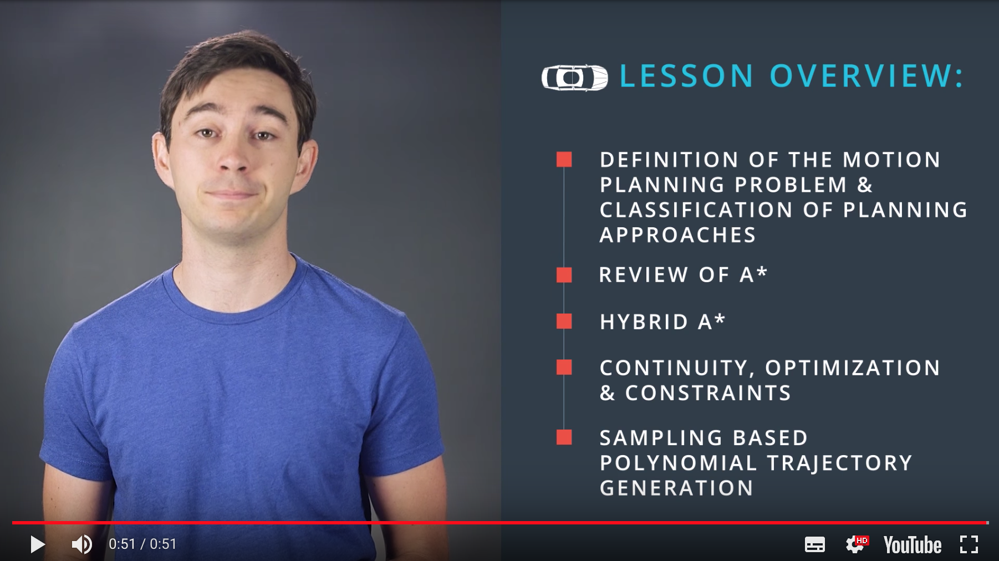

## 1. The Motion Planning Problem

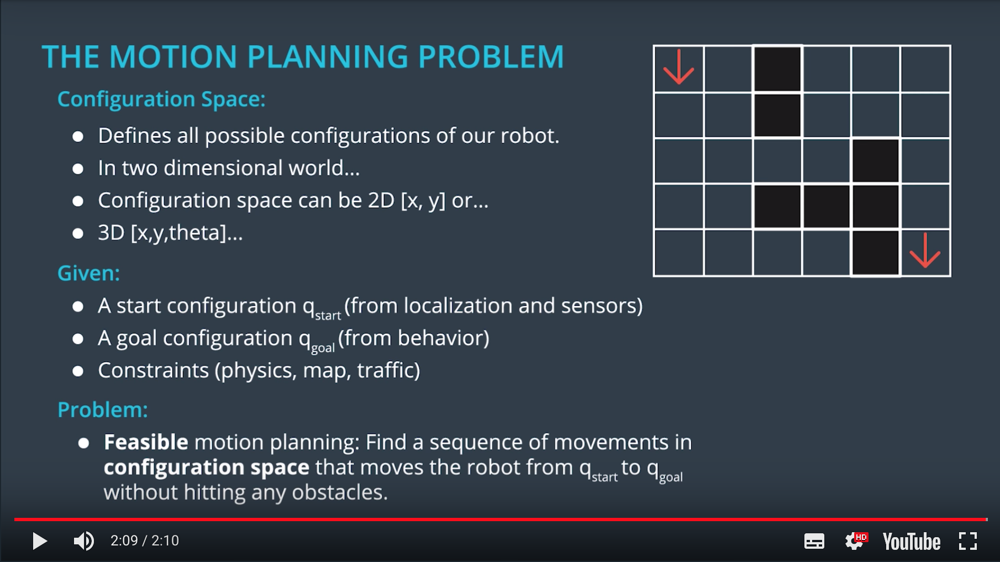

## 2. Properties of Motion Planning Algorithms

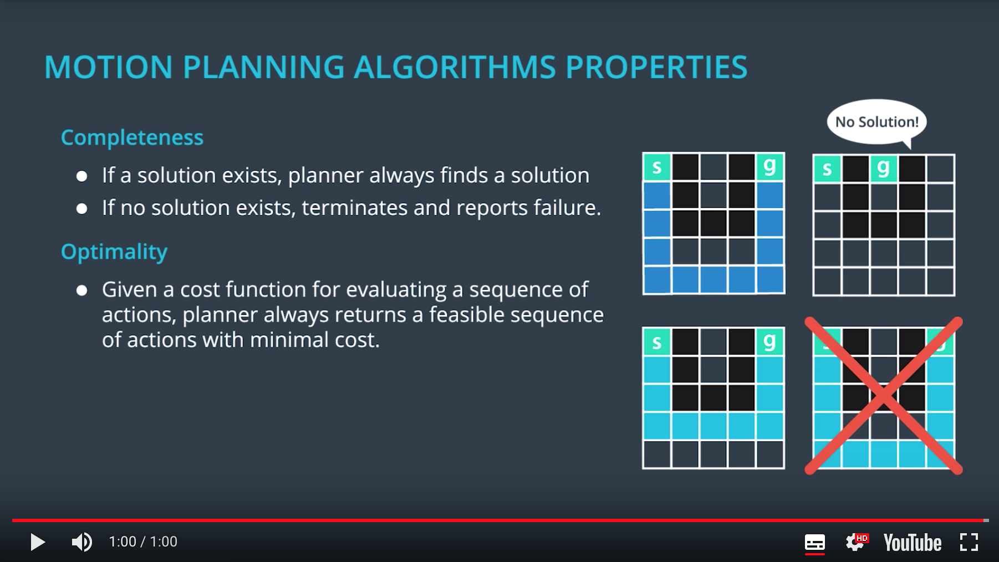

## 3. Types of Motion Planning Algorithms

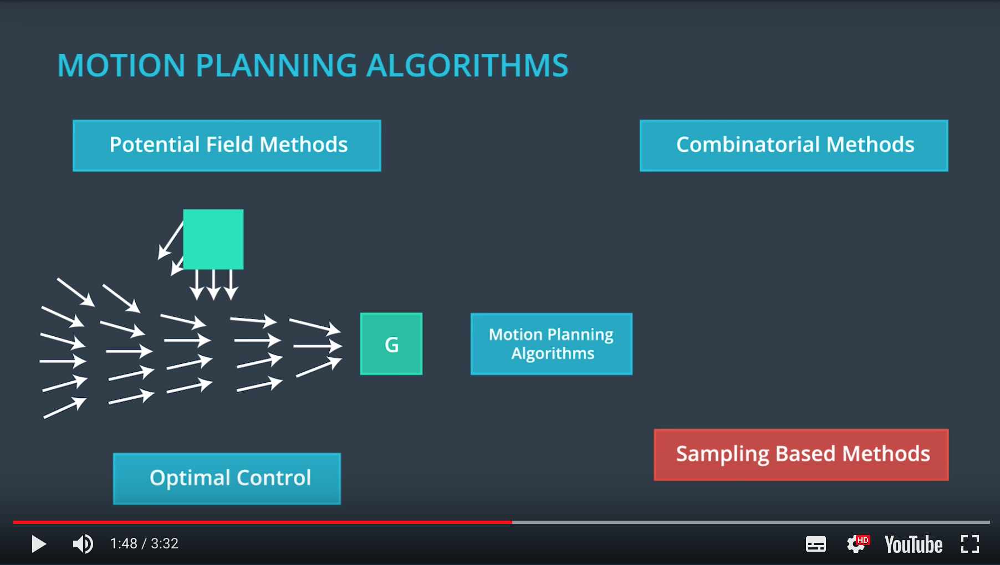

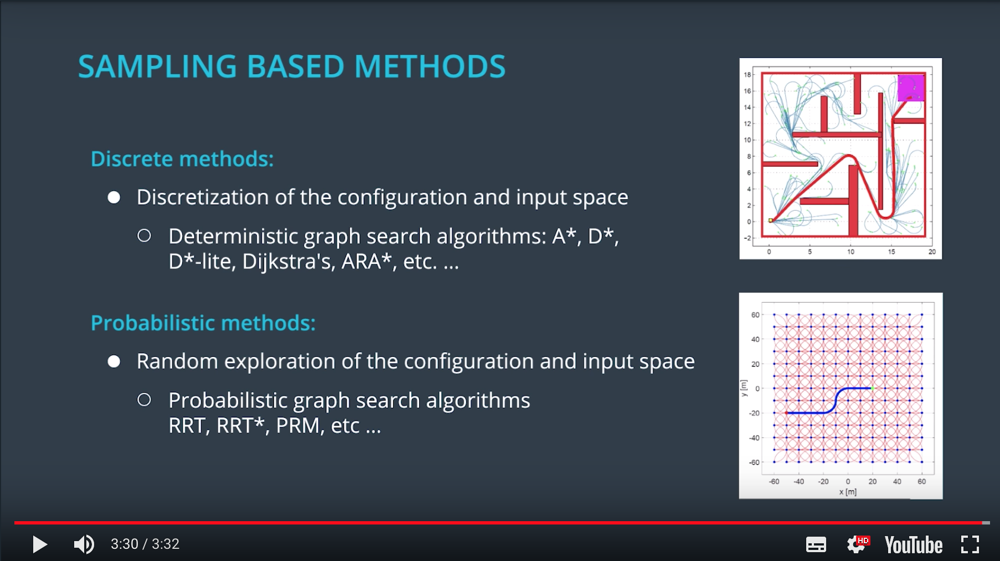

## 4. A* Reminder

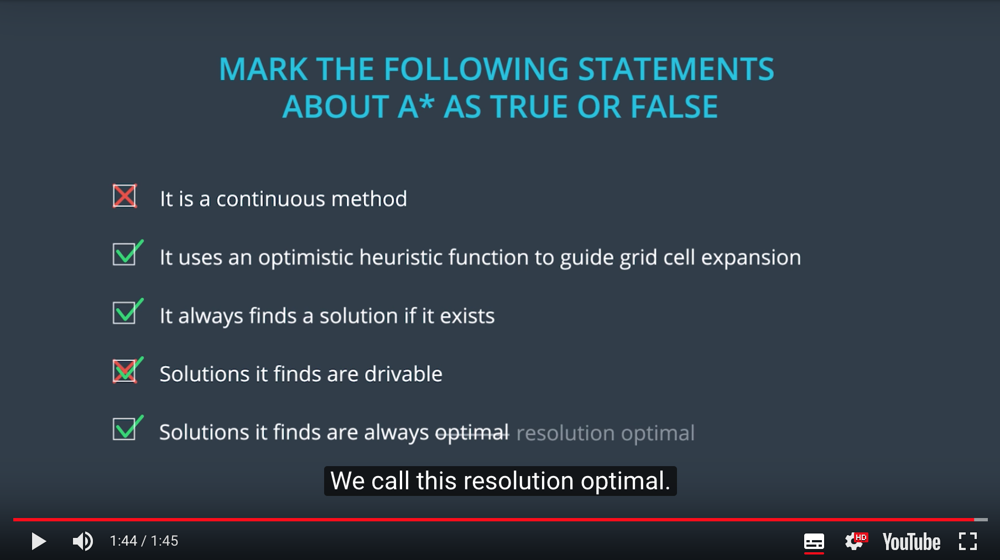

#### Note Regarding A* Heuristics and Optimal Solutions:
A* will find an optimal solution if the heuristic is [Admissible](https://en.wikipedia.org/wiki/Admissible_heuristic). A* may find a suboptimal path if the heuristic function is not Admissible.

## 5. Hybrid A*

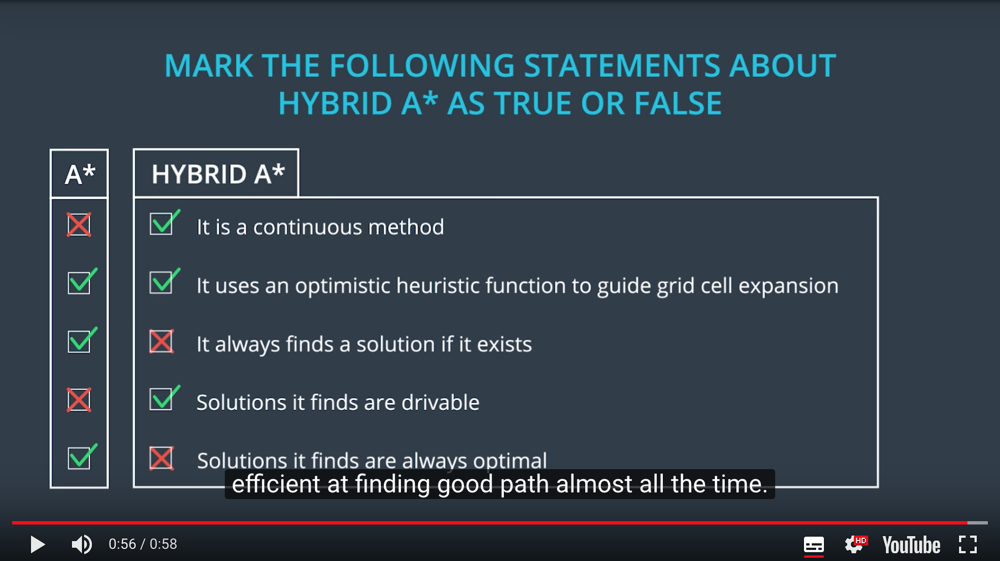

## 6. Hybrid A* Heuristics

The paper [Junior: The Stanford Entry in the Urban Challenge](https://d17h27t6h515a5.cloudfront.net/topher/2017/July/595fe838_junior-the-stanford-entry-in-the-urban-challenge/junior-the-stanford-entry-in-the-urban-challenge.pdf) is a good read overall, but Section 6.3 - Free Form Navigation is especially good and goes into detail about how the Stanford team thought about heuristics for their Hybrid A* algorithm (which they tended to use in parking lots).

max(h1, h2)

## 7. Hybrid A* Pseudocode

The pseudocode below outlines an implementation of the A* search algorithm using the bicycle model. The following variables and objects are used in the code but not defined there:

* `State(x, y, theta, g, f)`: An object which stores `x`, `y` coordinates, direction `theta`, and current `g` and `f` values.
* `grid`: A 2D array of 0s and 1s indicating the area to be searched. 1s correspond to obstacles, and 0s correspond to free space.
* `SPEED`: The speed of the vehicle used in the bicycle model.
* `LENGTH`: The length of the vehicle used in the bicycle model.
* `NUM_THETA_CELLS`: The number of cells a circle is divided into. This is used in keeping track of which States we have visited already.

The bulk of the hybrid A* algorithm is contained within the `search` function. The `expand` function takes a state and goal as inputs and returns a list of possible next states for a range of steering angles. This function contains the implementation of the bicycle model and the call to the A* heuristic function.

```python
def expand(state, goal):
    next_states = []
    for delta in range(-35, 40, 5): 
        # Create a trajectory with delta as the steering angle using 
        # the bicycle model:

        # ---Begin bicycle model---
        delta_rad = deg_to_rad(delta)
        omega = SPEED/LENGTH * tan(delta_rad)
        next_x = state.x + SPEED * cos(theta)
        next_y = state.y + SPEED * sin(theta)
        next_theta = normalize(state.theta + omega)
        # ---End bicycle model-----

        next_g = state.g + 1
        next_f = next_g + heuristic(next_x, next_y, goal)

        # Create a new State object with all of the "next" values.
        state = State(next_x, next_y, next_theta, next_g, next_f)
        next_states.append(state)

    return next_states

def search(grid, start, goal):
    # The opened array keeps track of the stack of States objects we are 
    # searching through.
    opened = []
    # 3D array of zeros with dimensions:
    # (NUM_THETA_CELLS, grid x size, grid y size).
    closed = [[[0 for x in range(grid[0])] for y in range(len(grid))] 
        for cell in range(NUM_THETA_CELLS)]
    # 3D array with same dimensions. Will be filled with State() objects 
    # to keep track of the path through the grid. 
    came_from = [[[0 for x in range(grid[0])] for y in range(len(grid))] 
        for cell in range(NUM_THETA_CELLS)]

    # Create new state object to start the search with.
    x = start.x
    y = start.y
    theta = start.theta
    g = 0
    f = heuristic(start.x, start.y, goal)
    state = State(x, y, theta, 0, f)
    opened.append(state)

    # The range from 0 to 2pi has been discretized into NUM_THETA_CELLS cells. 
    # Here, theta_to_stack_number returns the cell that theta belongs to. 
    # Smaller thetas (close to 0 when normalized  into the range from 0 to 
    # 2pi) have lower stack numbers, and larger thetas (close to 2pi when 
    # normalized) have larger stack numbers.
    stack_num = theta_to_stack_number(state.theta)
    closed[stack_num][index(state.x)][index(state.y)] = 1

    # Store our starting state. For other states, we will store the previous 
    # state in the path, but the starting state has no previous.
    came_from[stack_num][index(state.x)][index(state.y)] = state

    # While there are still states to explore:
    while opened:
        # Sort the states by f-value and start search using the state with the 
        # lowest f-value. This is crucial to the A* algorithm; the f-value 
        # improves search efficiency by indicating where to look first.
        opened.sort(key=lambda state:state.f)
        current = opened.pop(0)

        # Check if the x and y coordinates are in the same grid cell 
        # as the goal. (Note: The idx function returns the grid index for 
        # a given coordinate.)
        if (idx(current.x) == goal[0]) and (idx(current.y) == goal.y):
            # If so, the trajectory has reached the goal.
            return path

        # Otherwise, expand the current state to get a list of possible 
        # next states.
        next_states = expand(current, goal)
        for next_s in next_states:
            # If we have expanded outside the grid, skip this next_s.
            if next_s is not in the grid:
                continue
            # Otherwise, check that we haven't already visited this cell and
            # that there is not an obstacle in the grid there.
            stack_num = theta_to_stack_number(next_s.theta)
            if closed[stack_num][idx(next_s.x)][idx(next_s.y)] == 0 
                and grid[idx(next_s.x)][idx(next_s.y)] == 0:
                # The state can be added to the opened stack.
                opened.append(next_s)
                # The stack_number, idx(next_s.x), idx(next_s.y) tuple 
                # has now been visited, so it can be closed.
                closed[stack_num][idx(next_s.x)][idx(next_s.y)] = 1
                # The next_s came from the current state, and is recorded.
                came_from[stack_num][idx(next_s.x)][idx(next_s.y)] = current
```

## 8. Implementing Hybrid A*

In this exercise, you will be provided a working implementation of a breadth first search algorithm which does not use any heuristics to improve its efficiency. Your goal is to try to make the appropriate modifications to the algorithm so that it takes advantage of heuristic functions (possibly the ones mentioned in the previous paper) to reduce the number of grid cell expansions required.

### Instructions:
Modify the code in `hybrid_breadth_first.cpp` and hit `Test Run` to check your results.
Note the number of expansions required to solve an empty 15x15 grid (it should be about 18,000!). Modify the code to try to reduce that number. How small can you get it?


## 9. Environment Classification

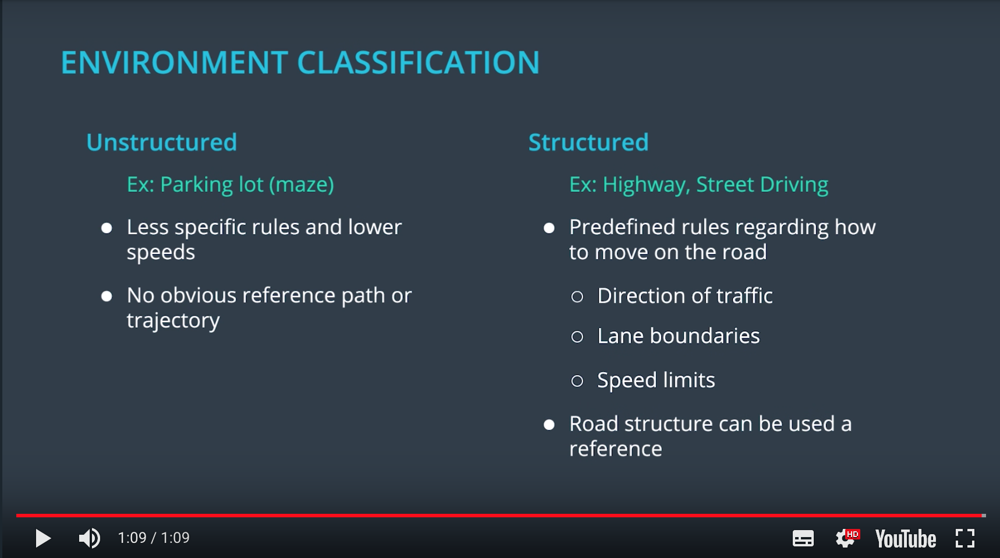

## 10. The Need for Time

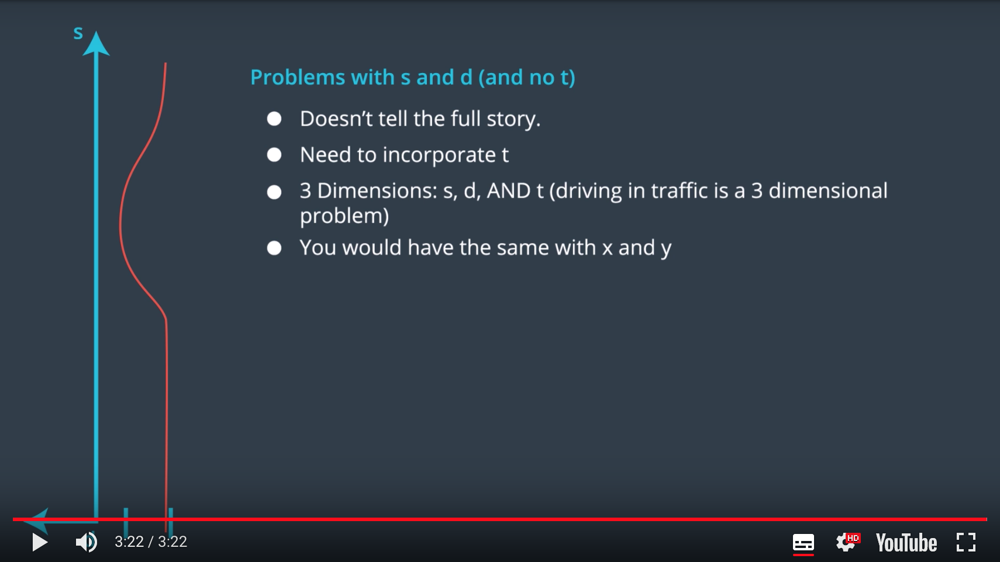

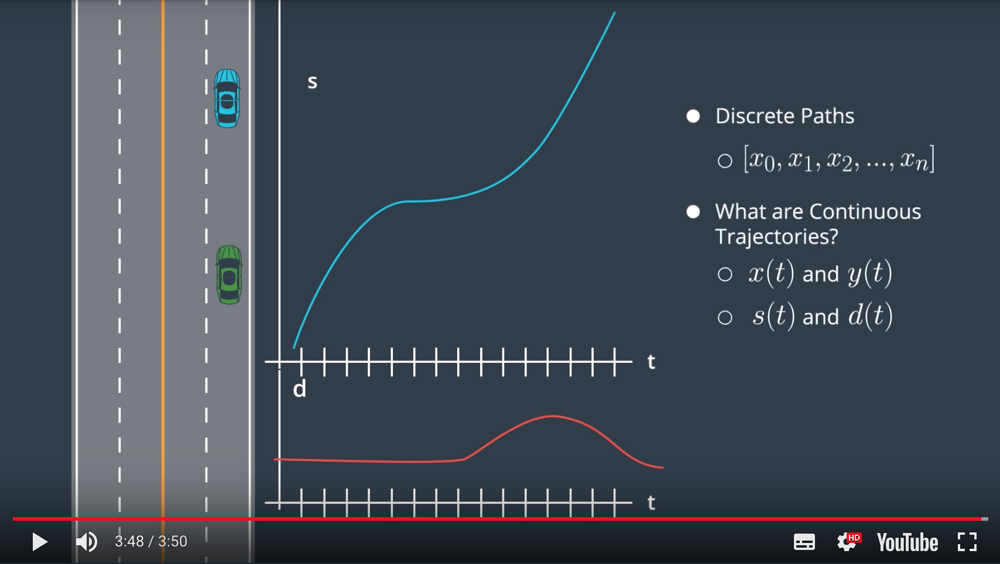

## 11. Trajectory Matching

Below you will see s vs. t and d vs. t graphs for four different trajectories (labeled Option A, B, C, and D). Match each set of graphs to the corresponding verbal description of the trajectory.

### Slow down in lane
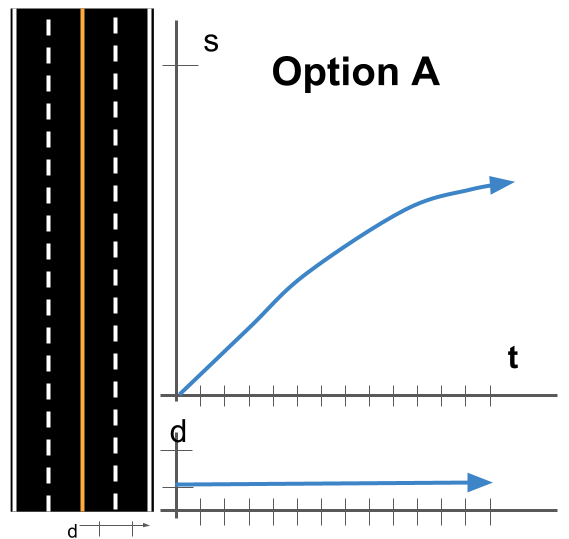

### Pass vehicle
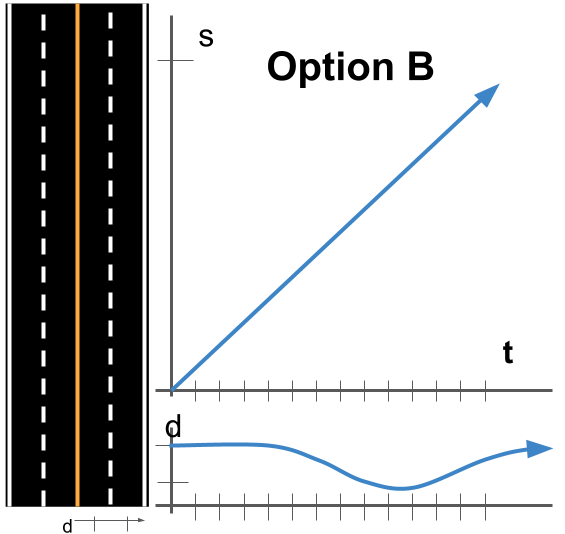

### Swerve quickly
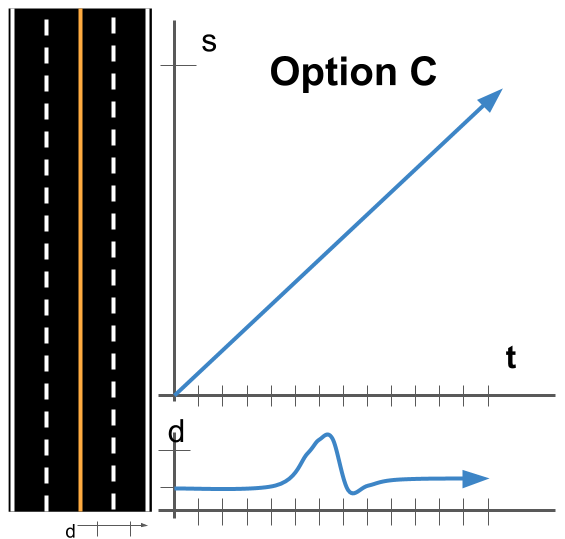

### Pull over and stop
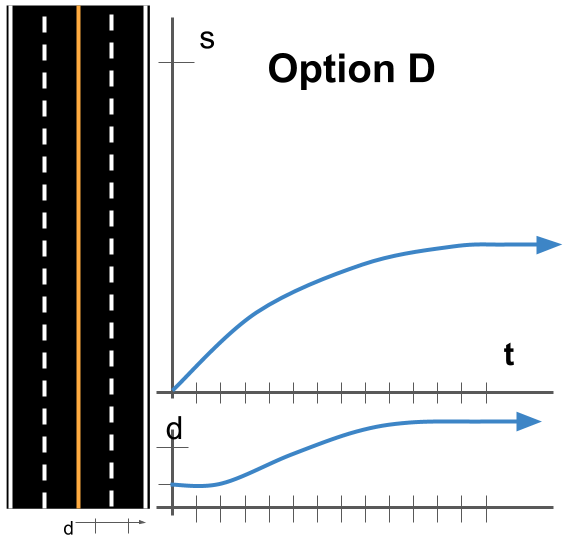

## 12. Structured Trajectory Generation Overview

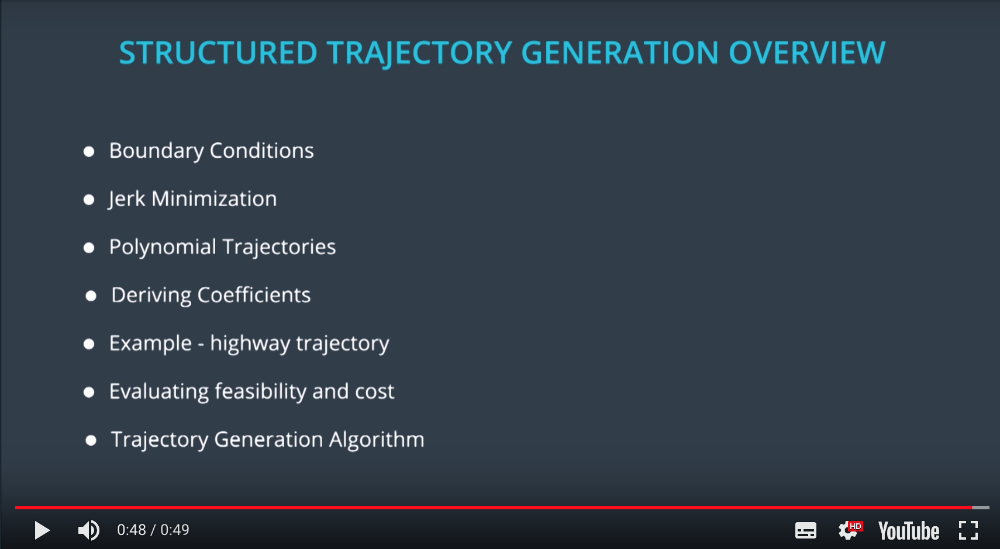

## 13. Trajectories with Boundary Conditions

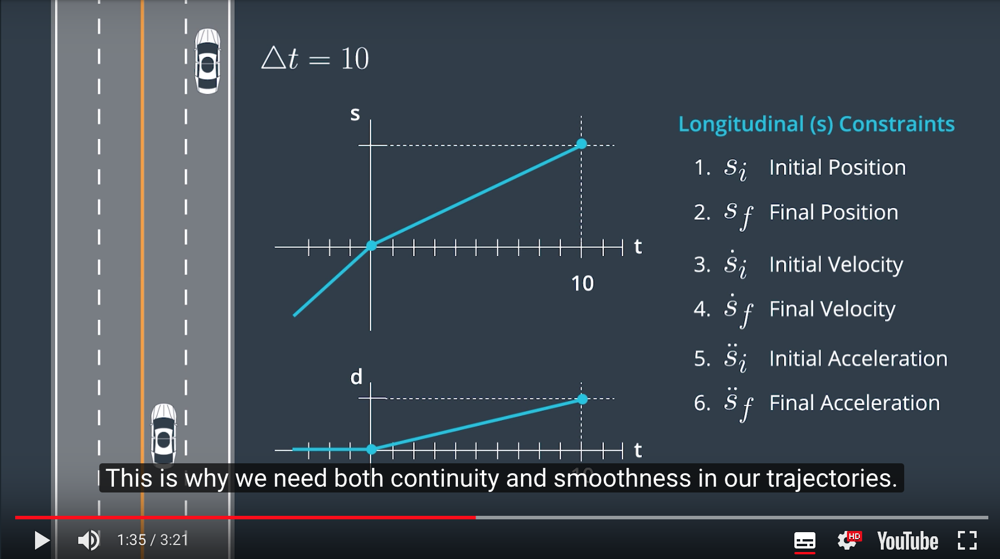

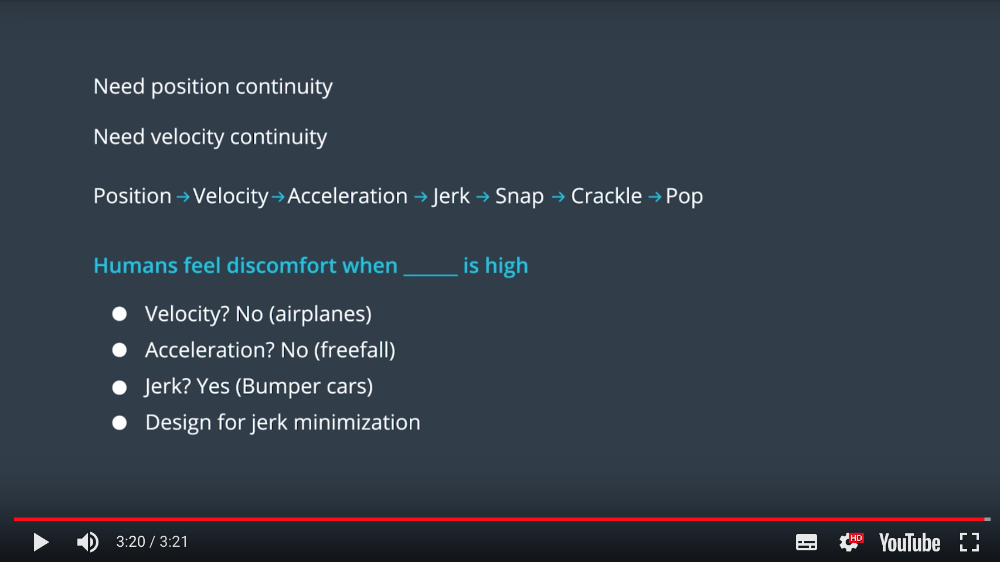

## 14. Jerk Minimizing Trajectories

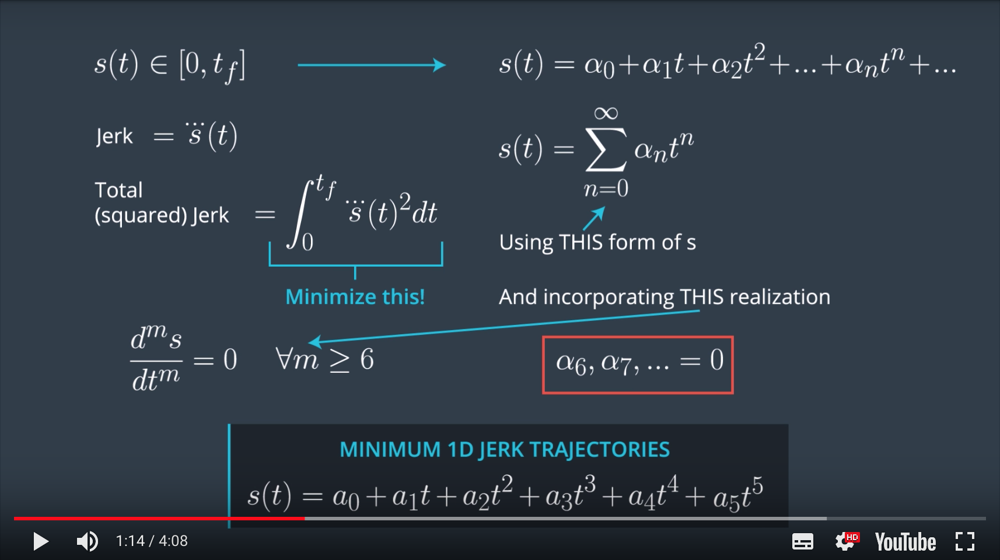

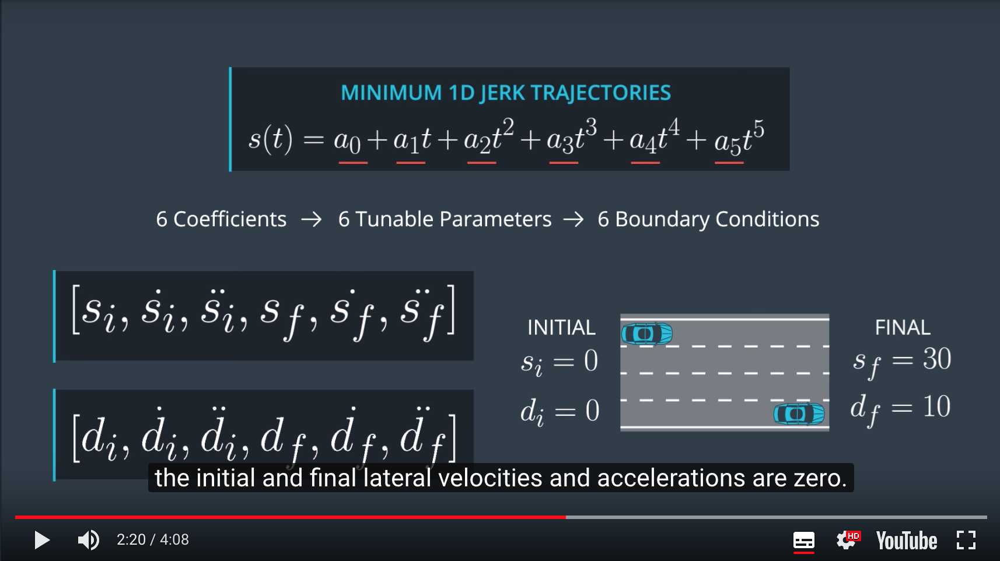

## 15. Derivation Overview

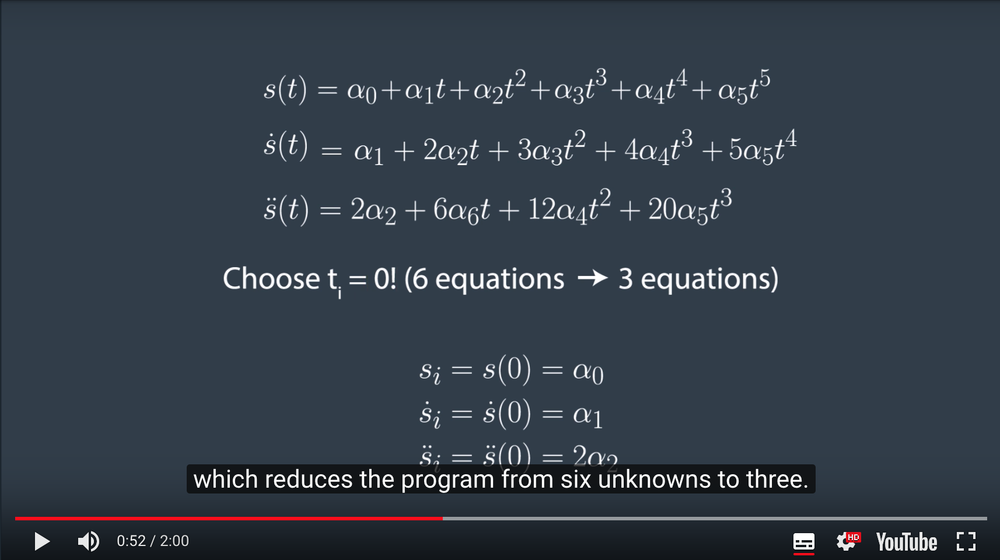

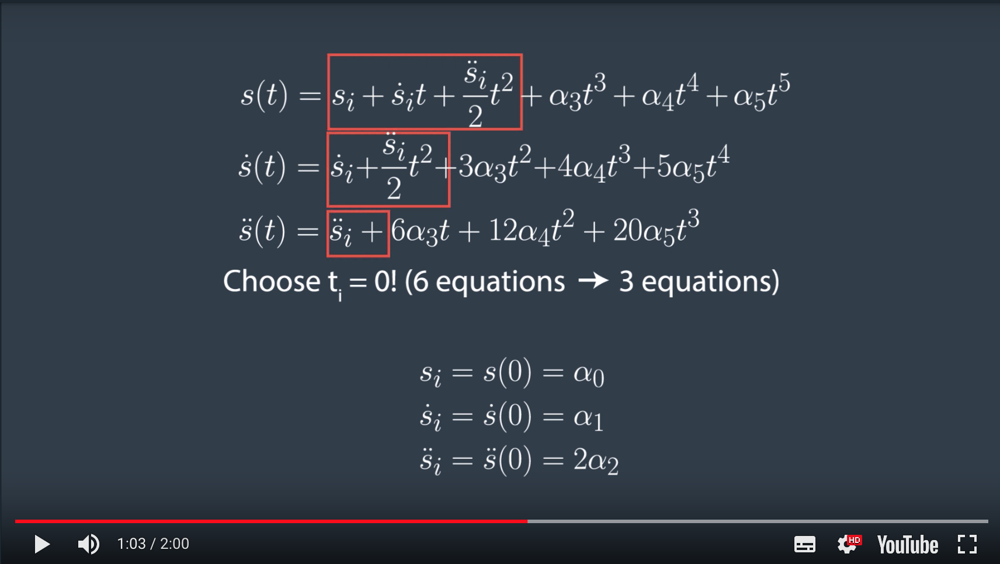

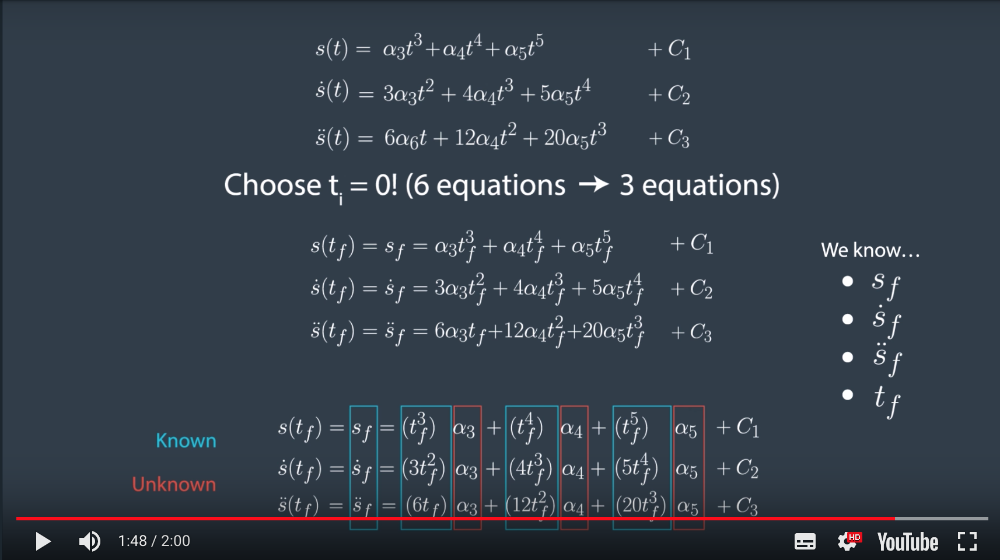

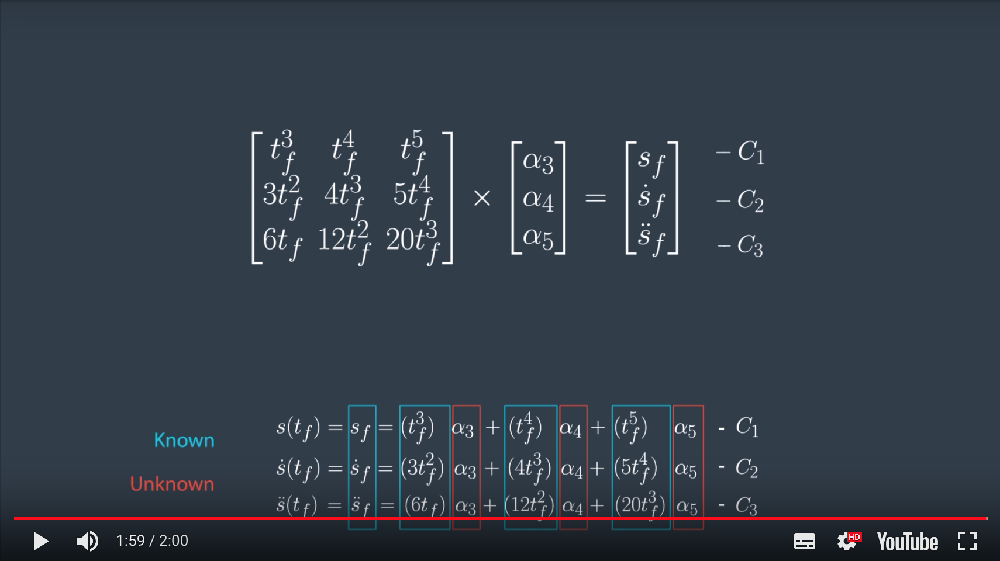

### Derivation Details

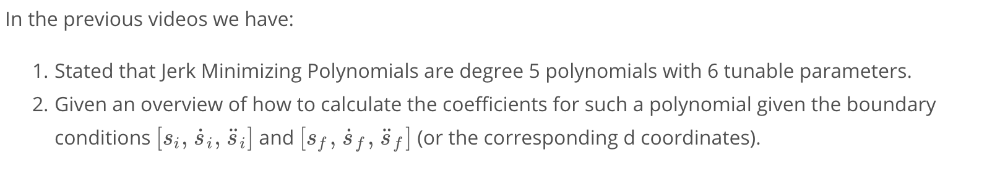

## 16. Implement a Quintic Polynomial Solver
In this exercise you will implement a quintic polynomial solver. This will let you take boundary conditions as input and generate a polynomial trajectory which matches those conditions with minimal jerk.

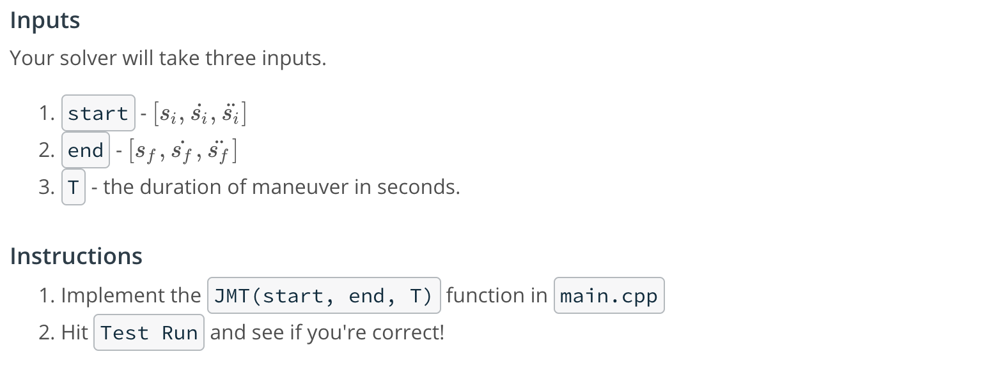

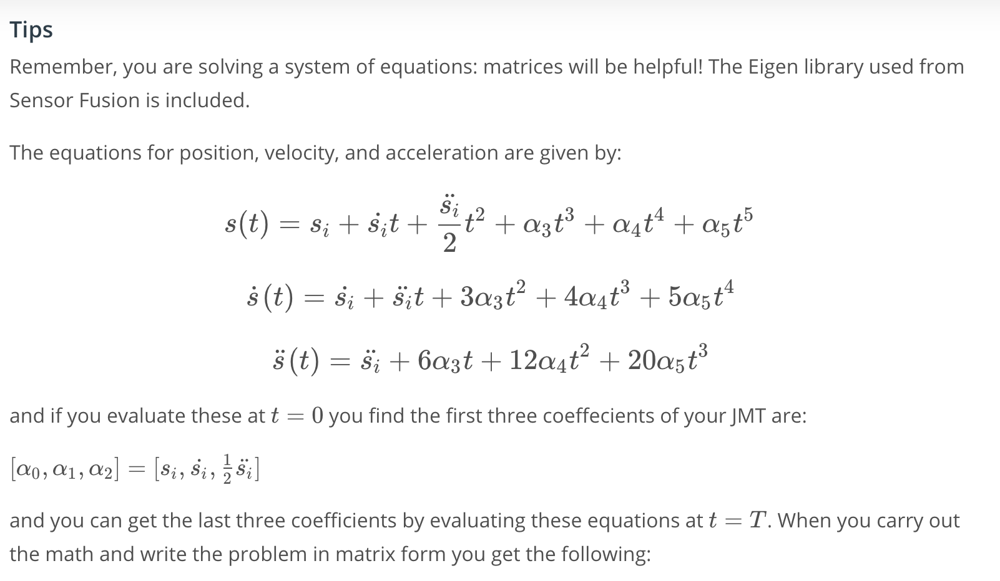

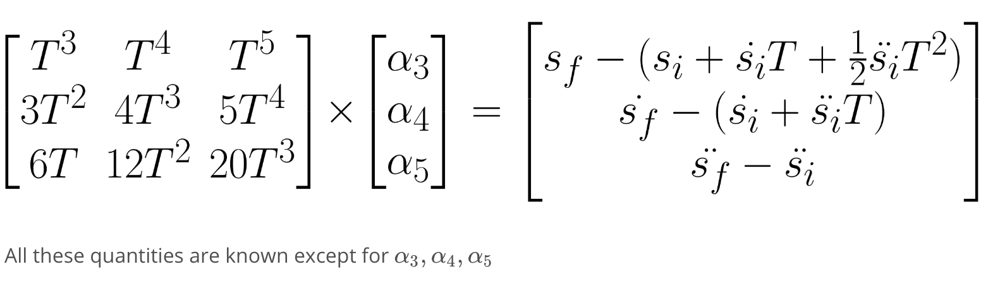

## 17. Implementing Feasibility

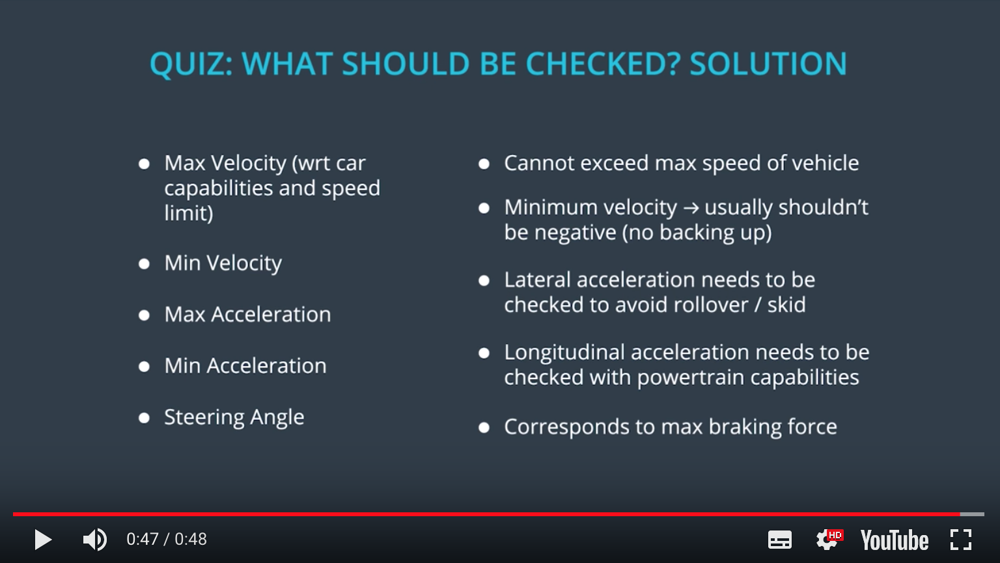

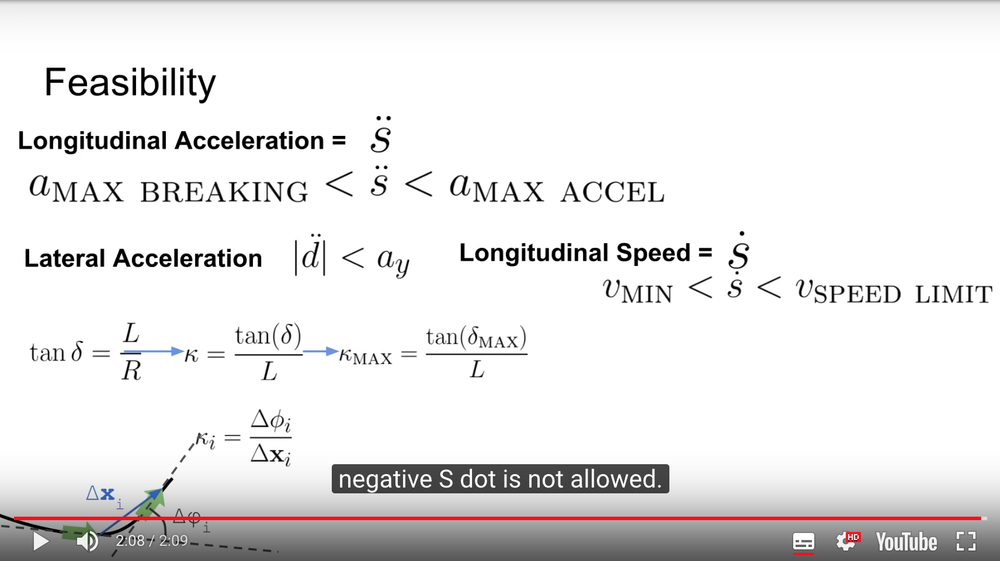

## 18. Putting it All Together

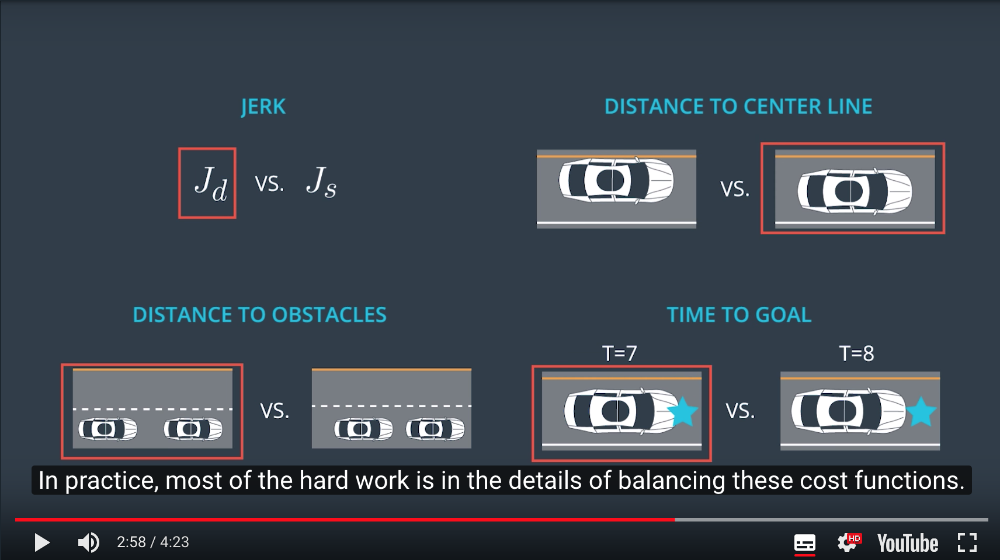

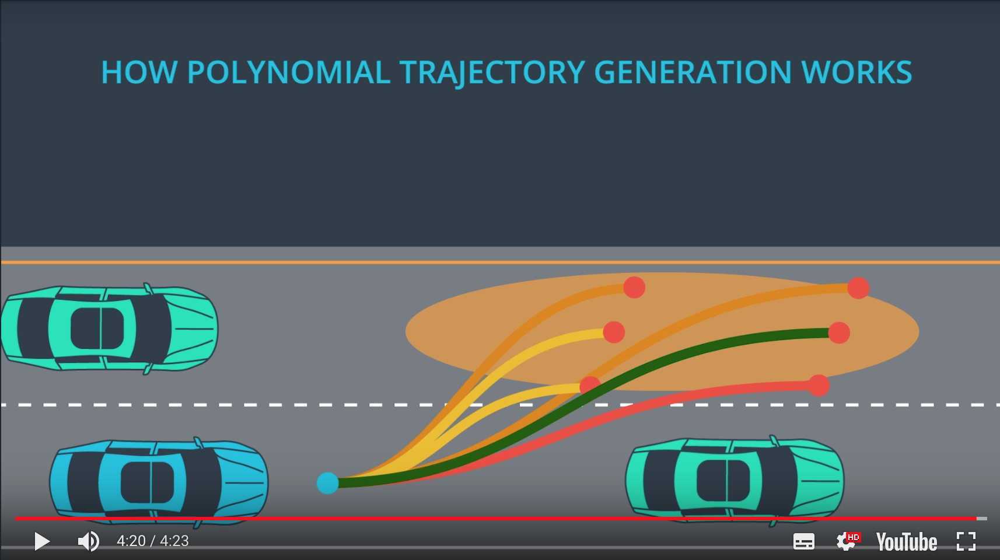

## 19. Polynomial Trajectory Reading (optional)

### Polynomial Trajectory Generation
If you are interested in learning more about PTG, I've included a link to a paper (below) titled "Optimal Trajectory Generation for Dynamic Street Scenarios in a Frenet Frame". It is short and discusses some interesting (and potentially useful) topics like:

1. Cost Functions.
2. Differences between high speed and low speed trajectory generation.
3. Implementation of specific maneuvers relevant to highway driving like following, merging, and velocity keeping.
4. How to combining lateral and longitudinal trajectories.
5. A derivation of the transformation from Frenet coordinates to global coordinates (in the appendix).

#### Supporting Materials
[Optimal Trajectory Generation For Dynamic Street Scenarios In A Frenet Frame](http://video.udacity-data.com.s3.amazonaws.com/topher/2017/July/595fd482_werling-optimal-trajectory-generation-for-dynamic-street-scenarios-in-a-frenet-frame/werling-optimal-trajectory-generation-for-dynamic-street-scenarios-in-a-frenet-frame.pdf)

## 20. Polynomial Trajectory Generation Playground

### Polynomial Playground (making PTG work)
Before you begin the final project we'd like to give you a chance to play around with cost function design and weight tweaking. In the Python code you will be provided, you will have a working Polynomial Trajectory Generator. You can see it in action by doing the following:

#### Getting Started
1. Download the project code by clicking **TrajectoryExercise2** at the bottom of this page.
2. From the project's directory, run `python evaluate_ptg.py`. You should see a plot similar to the one below. This plot shows the s (x-axis) and d(y-axis) trajectories followed by a vehicle in traffic (red) and a self driving car (blue).

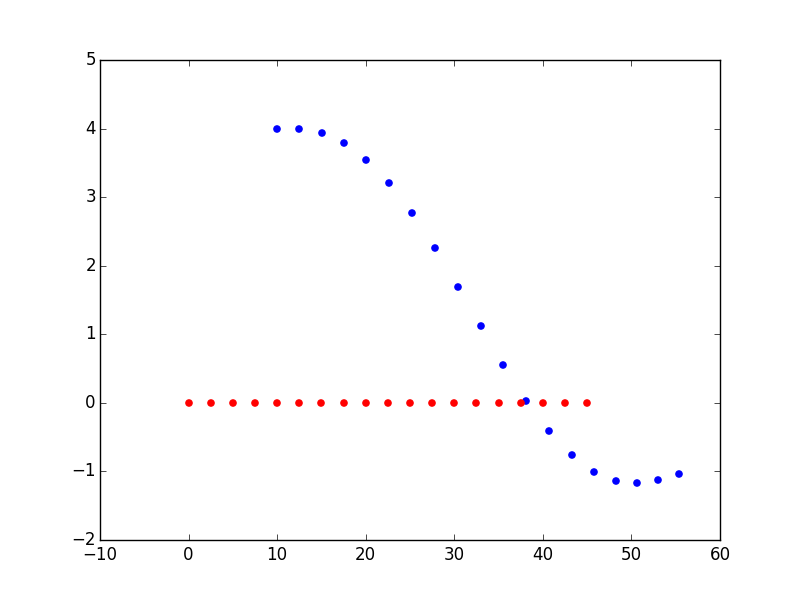

In this situation, the self driving car was trying to get behind the target vehicle, but the cost functions it was using weren't weighted appropriately and so it didn't behave as expected.

#### Fixing the Problem(s)
There are 5 files in the provided code. You'll probably want to start by modifying cost function weights in `ptg.py` but may also want to add cost functions of your own. As a bonus challenge try implementing this same code in C++.

#### File Descriptions
1. `ptg.py` - The primary code for generating a polynomial trajectory for some constraints. This is also where weights are assigned to cost functions. Adjusting these weights (and possibly adding new cost functions), can have a big effect on vehicle behavior.
2. `cost_functions.py` - This file contains many cost functions which are used in ptg.py when selecting the best trajectory. Some cost functions aren't yet implemented...
3. `evaluate_ptg.py` - This file sets a start state, goal, and traffic conditions and runs the PTG code. Feel free to modify the goal, add traffic, etc... to test your vehicle's trajectory generation ability.
4. `constants.py` - constants like speed limit, vehicle size, etc...
5. `helpers.py` - helper functions used by other files.

## 21. Bonus Round: Path Planning (Optional)

### Additional Resources on Path Planning
Nice work reaching the end of the path planning content! While you still have the project left to do here, we're also providing some additional resources and recent research on the topic that you can come back to if you have time later on.

Reading research papers is a great way to get exposure to the latest and greatest in the field, as well as expand your learning. However, just like the project ahead, it's often best to learn by doing - if you find a paper that really excites you, try to implement it (or even something better) yourself!

#### Optional Reading
All of these are completely optional reading - you could spend hours reading through the entirety of these! We suggest moving onto the project first so you have what you’ve learned fresh on your mind, before coming back to check these out.

We've categorized these papers to hopefully help you narrow down which ones might be of interest, as well including their Abstract section, which summarizes the paper. 

---

### Indoors

[Intention-Net: Integrating Planning and Deep Learning for Goal-Directed Autonomous Navigation](https://arxiv.org/abs/1710.05627) by S. W. Gao, et. al.

> **Abstract**: How can a delivery robot navigate reliably to a destination in a new office building, with minimal prior information? To tackle this challenge, this paper introduces a two-level hierarchical approach, which integrates model-free deep learning and model-based path planning. At the low level, a neural-network motion controller, called the intention-net, is trained end-to-end to provide robust local navigation. The intention-net maps images from a single monocular camera and "intentions" directly to robot controls. At the high level, a path planner uses a crude map, e.g., a 2-D floor plan, to compute a path from the robot's current location to the goal. The planned path provides intentions to the intention-net. Preliminary experiments suggest that the learned motion controller is robust against perceptual uncertainty and by integrating with a path planner, it generalizes effectively to new environments and goals.

---

### City Navigation

[Learning to Navigate in Cities Without a Map](https://arxiv.org/abs/1804.00168) by P. Mirowski, et. al.

> **Abstract**: Navigating through unstructured environments is a basic capability of intelligent creatures, and thus is of fundamental interest in the study and development of artificial intelligence. Long-range navigation is a complex cognitive task that relies on developing an internal representation of space, grounded by recognizable landmarks and robust visual processing, that can simultaneously support continuous self-localization ("I am here") and a representation of the goal ("I am going there"). Building upon recent research that applies deep reinforcement learning to maze navigation problems, we present an end-to-end deep reinforcement learning approach that can be applied on a city scale. [...] We present an interactive navigation environment that uses Google StreetView for its photographic content and worldwide coverage, and demonstrate that our learning method allows agents to learn to navigate multiple cities and to traverse to target destinations that may be kilometers away. [...]

---

### Intersections

[A Look at Motion Planning for Autonomous Vehicles at an Intersection](https://arxiv.org/abs/1806.07834) by S. Krishnan, et. al.

> **Abstract**: Autonomous Vehicles are currently being tested in a variety of scenarios. As we move towards Autonomous Vehicles, how should intersections look? To answer that question, we break down an intersection management into the different conundrums and scenarios involved in the trajectory planning and current approaches to solve them. Then, a brief analysis of current works in autonomous intersection is conducted. With a critical eye, we try to delve into the discrepancies of existing solutions while presenting some critical and important factors that have been addressed. Furthermore, open issues that have to be addressed are also emphasized. We also try to answer the question of how to benchmark intersection management algorithms by providing some factors that impact autonomous navigation at intersection.

---

### Planning in Traffic with Deep Reinforcement Learning

[DeepTraffic: Crowdsourced Hyperparameter Tuning of Deep Reinforcement Learning Systems for Multi-Agent Dense Traffic Navigation](https://arxiv.org/abs/1801.02805) by L. Fridman, J. Terwilliger and B. Jenik

> **Abstract**: We present a traffic simulation named DeepTraffic where the planning systems for a subset of the vehicles are handled by a neural network as part of a model-free, off-policy reinforcement learning process. The primary goal of DeepTraffic is to make the hands-on study of deep reinforcement learning accessible to thousands of students, educators, and researchers in order to inspire and fuel the exploration and evaluation of deep Q-learning network variants and hyperparameter configurations through large-scale, open competition. This paper investigates the crowd-sourced hyperparameter tuning of the policy network that resulted from the first iteration of the DeepTraffic competition where thousands of participants actively searched through the hyperparameter space.